In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import pandas as pd
import toolkit as kit
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import black_litterman_constrained as BL
import scipy.optimize as opt
import itertools
from scipy.optimize import minimize
from dateutil.relativedelta import relativedelta


%load_ext autoreload
%autoreload 2
%matplotlib inline

sns.set(style="dark")
plt.style.use("ggplot")
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = [12, 8]

# Import All Data

We will use data from 1993-07 to 2023-07. And any time before 1993-07 serves as the burnt-in set.

In [4]:
# Download historical data for S&P 500
sp500 = yf.download('^GSPC', start="1990-04-01", end="2023-08-01", progress=False)
sp500_monthly = sp500['Adj Close'].resample('M').ffill().pct_change().dropna()
sp500_monthly.index = pd.to_datetime(sp500_monthly.index, format="%Y%m").to_period('M')
sp500_monthly

Date
1990-05    0.091989
1990-06   -0.008886
1990-07   -0.005223
1990-08   -0.094314
1990-09   -0.051184
             ...   
2023-03    0.035052
2023-04    0.014642
2023-05    0.002482
2023-06    0.064727
2023-07    0.031139
Freq: M, Name: Adj Close, Length: 399, dtype: float64

In [5]:
views_simple = pd.read_csv('../Data/views_simple.csv', header=0, index_col=0)['1993-07':]
views_weighted = pd.read_csv('../Data/views_weighted.csv', header=0, index_col=0)['1993-07':]
decisions_simple = pd.read_csv('../Data/decisions_simple.csv', header=0, index_col=0)['1993-07':]
decisions_weighted = pd.read_csv('../Data/decisions_weighted.csv', header=0, index_col=0)['1993-07':]
confidence_simple = pd.read_csv('../Data/confidence_simple.csv', header=0, index_col=0)['1993-07':]
confidence_weighted = pd.read_csv('../Data/confidence_weighted.csv', header=0, index_col=0)['1993-07':]

In [6]:
ind30_rets = kit.get_ind_returns(weighting='vw', n_inds=30)
ind30_mcap = kit.get_ind_market_caps(30, weights=True)

In [7]:
rf = kit.get_risk_free_rate()['1990-03':'2023-06']
rf.tail()

,RF
2023-02,0.0034
2023-03,0.0036
2023-04,0.0035
2023-05,0.0036
2023-06,0.0040


## Brief Summary of Black-Litterman Model

For $N$ assets, and $K$ views: 

\begin{array}{ll}
w & \mbox{A Column Vector ($N \times 1$) of Equilibrium Market Weights of the Assets} \\
\Sigma & \mbox{A Covariance Matrix ($N \times N$) of the Assets} \\
R_f & \mbox{The Risk Free Rate} \\
\delta & \mbox{The investor's Risk Aversion parameter}  \\
\tau & \mbox{A scalar indicating the uncertainty of the prior}\\
Q & \mbox{An $K \times 1$ Views matrix} \\
P & \mbox{A $K \times N$ ``Projection'' matrix} \\
\Omega & \mbox{Uncertainty Matrix}
\end{array}

#### The Master Formula

The first step of the procedure is a _reverse-optimization_ step that infers the implied returns vector $\pi$ that are implied by the equilibrium weights $w$ using the formula:

$$\pi = \delta\Sigma w$$

Next, the posterior returns and covariances are obtained from the _Black-Litterman Master Formula_ which is the following set of equations:

\begin{equation}
\label{eq:blMuOrig}
\mu^{BL} = [(\tau\Sigma)^{-1} + P \Omega^{-1} P]^{-1}[(\tau\Sigma)^{-1} \pi + P \Omega^{-1} Q]
\end{equation}

\begin{equation}
\label{eq:blSigmaOrig}
\Sigma^{BL} = \Sigma + [(\tau\Sigma)^{-1} + P \Omega^{-1} P]^{-1}
\end{equation}


## Model Implementation

We first find $\delta$: the risk-aversion parameter. Since the model is fully automatic, we use market-implied risk-aversion using SP500 as the hypothetical market portfolio. 

Market-implied risk aversion is a concept derived from mean-variance analysis, a fundamental part of Modern Portfolio Theory. This concept tries to quantify the level of risk aversion implied by market prices and returns. It's a way of understanding how much risk investors are willing to take on, given the expected returns of their investments.

### Formula

The formula to calculate market-implied risk aversion typically involves the Sharpe ratio of the market portfolio. The Sharpe ratio is defined as the excess return of the portfolio over the risk-free rate, divided by the standard deviation of the portfolio's excess return:

$$ \text{Sharpe Ratio} = \frac{R_m - R_f}{\sigma_m} $$

Where:
- $R_m$ is the return of the market portfolio.
- $R_f$ is the risk-free rate.
- $\sigma_m$ is the standard deviation of the market portfolio's return.

The market-implied risk aversion coefficient $\delta$ can be estimated using the Sharpe ratio:

$$\delta = \frac{R_m - R_f}{\sigma_m^2}$$

In [15]:
def market_implied_risk_aversion(market_ret, risk_free_rate, frequency=12):
    """
    Calculate the market-implied risk-aversion parameter (i.e market price of risk)
    based on market monthly returns.
    """
    annualized_var = market_ret.rolling(window=frequency).var().dropna() * frequency
    annualized_return = market_ret.rolling(window=frequency).mean().dropna() * frequency
    risk_free_rate = risk_free_rate.rolling(window=frequency).mean().dropna() * frequency
    return (annualized_return - risk_free_rate) / annualized_var

In [16]:
delta = market_implied_risk_aversion(sp500_monthly['1992-07':'2023-06'], rf['RF']['1992-07':'2023-06'], frequency=12)
delta.describe()

count    361.000000
mean      10.140161
std       18.171006
min      -12.821880
25%        0.055330
50%        5.692135
75%       14.769786
max      121.460412
dtype: float64

We observe the range of values of risk aversion coefficient is too wide.

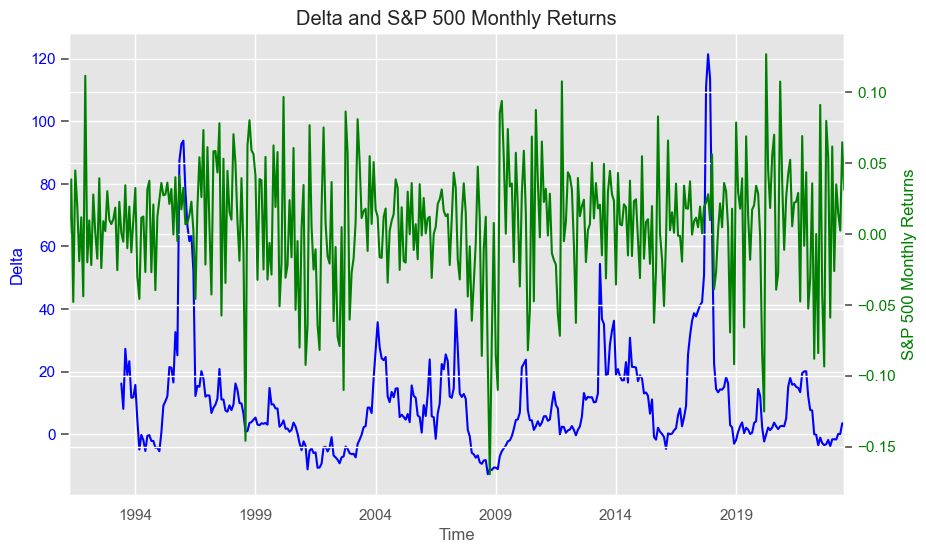

In [17]:
# Create a figure and a single subplot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot 'delta' on the left y-axis
delta.plot(ax=ax1, color='blue')
ax1.set_xlabel('Time')
ax1.set_ylabel('Delta', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for the second plot
ax2 = ax1.twinx()

# Plot 'sp500_monthly' on the right y-axis
sp500_monthly['1991-04':].plot(ax=ax2, color='green')
ax2.set_ylabel('S&P 500 Monthly Returns', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set the title
plt.title('Delta and S&P 500 Monthly Returns');

Refering to 'Risk Aversion at the Country Level ['https://files.stlouisfed.org/files/htdocs/wp/2014/2014-005.pdf']:

"Although there is a vast literature on measuring risk aversion, there is not yet a commonly accepted estimate. Probably the most commonly accepted measures of the coefficient of relative risk aversion lie between 1 and 3, but there is a wide range of estimates in the literature—from as low as 0.2 to 10 and higher."

We will try 2 sets of values, one keeping $\delta \in [1, 3]$ and another keeping $\delta \in [0.01, 10]$.

## Construct a Class for Each Single Period

Let's start from an example of a single period. We want to use data from 1992-07 to 1993-06 as training data to get the BL weight for the month of 1993-07.1993-07

In [76]:
def market_implied_risk_aversion(market_ret, risk_free_rate, frequency=12, adjustment=None):
    """
    Calculate the market-implied risk-aversion parameter (i.e market price of risk)
    based on market monthly returns.
    """
    annualized_var = market_ret.var() * frequency
    annualized_return = market_ret.mean() * frequency
    delta = (annualized_return - risk_free_rate * frequency) / annualized_var
    if adjustment is None:
        return delta
    elif delta > adjustment[1]: 
        delta = adjustment[1]
    elif delta < adjustment[0]:
        delta = adjustment[0]
    return delta

In [85]:
def market_implied_prior_returns(market_caps, risk_aversion, cov_matrix, T, rf_rate):
    """
    The neutral prior distribution is obtained by reverse engineering assuming 
    market or benchmark is the optimal portfolio. 
    
    Weights are taking from the begining of the rolling period.
    """
    return (risk_aversion * cov_matrix@market_caps) + T * rf_rate

In [78]:
def update_P_Q(absolute_view):
    """
    Given a collection of absolute views, construct
    the appropriate views vector and picking matrix. 
    """
    K = np.sum(absolute_view != 0)
    N = 30
    Q = np.zeros((K, 1))
    P = np.zeros((K, N))
    for i, ind in enumerate(absolute_view.keys()):
        Q[i] = absolute_view[ind]
        P[i, list(absolute_view.keys()).index(ind)] = 1
    return P, Q

In [79]:
def idzorek_method(view_confidences, cov_matrix, Q, P, tau, risk_aversion):
    """
    Use Idzorek's method to create the uncertainty matrix given user-specified
    percentage confidences. We use the closed-form solution described by
    Jay Walters in The Black-Litterman Model in Detail (2014).

    :param view_confidences: Kx1 vector of percentage view confidences (between 0 and 1),
                            required to compute omega via Idzorek's method.
    :type view_confidences: np.ndarray, pd.Series, list,, optional
    :return: KxK diagonal uncertainty matrix
    :rtype: np.ndarray
    """
    view_omegas = []
    for ind in range(len(Q)):
        conf = view_confidences[ind]

        if conf <= 1e-60:
            view_omegas.append(1e6)
            continue

        P_view = P[ind]
        alpha = (1 - conf) / conf  # formula (44)
        omega = tau * alpha * P_view @ cov_matrix @ P_view.T  # formula (41)
        view_omegas.append(omega.item())

    return np.diag(view_omegas)

In [80]:
def default_omega(cov_matrix, P, tau):
    """
    If the uncertainty matrix omega is not provided, we calculate using the method of
    He and Litterman (1999), such that the ratio omega/tau is proportional to the
    variance of the view portfolio.

    :return: KxK diagonal uncertainty matrix
    :rtype: np.ndarray
    """
    return np.diag(np.diag(tau * P @ cov_matrix @ P.T))

In [81]:
def bl_returns():
    """
    Calculate the posterior estimate of the returns vector,
    given views on some assets.
    """
    
    pi = np.array(ir)
    A = np.linalg.inv(tau * cov_matrix) + P.T@omega@P
    b = np.linalg.inv(tau * cov_matrix)@pi + P.T@omega@Q    

    post_rets = np.linalg.solve(A, b)
    return pd.Series(post_rets.flatten(), index=inds_names)

In [82]:
def bl_cov():
    """
    Calculate the posterior estimate of the covariance matrix,
    given views on some assets. Use Tikhonov regularization if omega is singular.
    """
    if np.linalg.det(omega) != 0:
        omega_inv = np.linalg.inv(omega)
    else:
        epsilon = 1e-5  
        omega_reg = omega + epsilon * np.eye(omega.shape[0])
        omega_inv = np.linalg.inv(omega_reg)
    M = np.linalg.inv(np.linalg.inv(tau * cov_matrix) + P.T@omega_inv@P)
    posterior_cov = np.array(cov_matrix) + M
    return pd.DataFrame(posterior_cov, index=inds_names, columns=inds_names)

In [107]:
def mean_variance_weights(risk_aversion=None):
    """
    The optimal portfolio can be constructed using the standard 
    mean-variance optimization method with constraints with no short selling 
    and sum of weights adds to 1.
    """
    posterior_ret = bl_returns()
    posterior_cov = bl_cov()
    n = len(posterior_ret)
    
    def objective(w):
        return - (w @ posterior_ret - risk_aversion / 2 * w @ posterior_cov @ w)
    
    constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
    bounds = tuple((0, 1) for _ in range(n))
    init_guess = np.array([1/n] * n)
    result = minimize(objective, init_guess, method='SLSQP', bounds=bounds, constraints=constraints)
    
    if not result.success:
        raise ValueError("Optimization did not converge")

    return pd.Series(result.x, index=inds_names)
    

In [105]:
def msr_weights(riskfree_rate):
    """
    Returns the weights of the portfolio that gives you the maximum sharpe ratio
    given the riskfree rate and expected returns and a covariance matrix
    """
    posterior_ret = bl_returns()
    posterior_cov = bl_cov()
    n = len(posterior_ret)
    init_guess = np.repeat(1/n, n)
    bounds = ((0.0, 1.0),) * n 
    weights_sum_to_1 = {'type': 'eq',
                        'fun': lambda weights: np.sum(weights) - 1
    }
    def neg_sharpe(weights, riskfree_rate, posterior_ret, posterior_cov):
        """
        Returns the negative of the sharpe ratio
        of the given portfolio
        """
        r = kit.portfolio_return(weights, posterior_ret)
        vol = kit.portfolio_vol(weights, posterior_cov)
        return -(r - riskfree_rate)/vol
    
    weights = minimize(neg_sharpe, init_guess,
                       args=(riskfree_rate, posterior_ret, posterior_cov), method='SLSQP',
                       options={'disp': False},
                       constraints=(weights_sum_to_1,),
                       bounds=bounds)
    return pd.Series(weights.x, index=inds_names)

In [16]:
def bl_weights(risk_aversion=None):
    """
    Compute the weights implied by the posterior returns, given the
    market price of risk. Technically this can be applied to any
    estimate of the expected returns, and is in fact a special case
    of mean-variance optimization. In short, these are the MSR portfolio weights.
    """
    posterior_rets = bl_returns()
    A = risk_aversion * bl_cov()
    b = posterior_rets
    raw_weights = np.linalg.solve(A, b)
    weights = raw_weights / raw_weights.sum()
    return pd.Series(weights, index=inds_names)

In [86]:
T = 12
market_ret = sp500_monthly['1992-07': '1993-06']
ind_ret = ind30_rets['1992-07': '1993-06']
inds_names = ind30_rets.columns
mcap = ind30_mcap['1992-07': '1993-06'].head(1).values.reshape(-1, 1)
# std_vec = ret.std() * np.sqrt(T)
# cov_matrix = (std_vec.T).dot(std_vec) * ret.corr()
cov_matrix = ind_ret.cov() * T
absolute_view = views_simple.iloc[0]
view_confidence = confidence_simple.iloc[0]
view_confidence = np.array(view_confidence[absolute_view != 0]).reshape(-1,1)
rf_rate = rf.loc['1993-06', 'RF']
adjustment = [1, 3]
tau = 1/T

In [113]:
model = BL.BlackLittermanModel(T, market_ret, ind_ret, inds_names, mcap, absolute_view, view_confidence, rf_rate, adjustment, 'default')
model.get_BL_Weights()@ ind30_rets.loc['1993-07'].values

0.032074387214064345

In [116]:
sp500_monthly.loc['1993-07']

-0.00532704570835929

In [114]:
model.get_BL_Weights()

Food     0.000000e+00
Beer     1.020875e-16
Smoke    0.000000e+00
Games    2.050567e-16
Books    1.295038e-16
Hshld    1.151206e-16
Clths    0.000000e+00
Hlth     2.801810e-16
Chems    1.533542e-17
Txtls    0.000000e+00
Cnstr    2.842609e-16
Steel    9.487659e-17
FabPr    3.501514e-01
ElcEq    2.736617e-01
Autos    0.000000e+00
Carry    1.092067e-16
Mines    1.700954e-16
Coal     3.761869e-01
Oil      5.224016e-17
Util     0.000000e+00
Telcm    0.000000e+00
Servs    0.000000e+00
BusEq    0.000000e+00
Paper    0.000000e+00
Trans    0.000000e+00
Whlsl    1.692558e-16
Rtail    0.000000e+00
Meals    0.000000e+00
Fin      1.683205e-16
Other    1.600168e-16
dtype: float64

In [87]:
delta = market_implied_risk_aversion(market_ret, rf_rate, frequency=T, adjustment=adjustment)

In [88]:
ir = market_implied_prior_returns(mcap, delta, cov_matrix, T, rf_rate)
ir.head()

,0
Food,0.054221
Beer,0.048580
Smoke,0.060548
Games,0.055606
Books,0.045820


In [89]:
P, Q = update_P_Q(absolute_view)

In [90]:
omega = idzorek_method(view_confidence, cov_matrix, Q, P, tau, delta)

In [91]:
np.round(omega[np.nonzero(omega)], 10)

array([3.98000000e-08, 3.10000000e-09, 7.00000000e-10, 1.88887653e+08,
       0.00000000e+00, 1.10660000e-06, 4.06985756e-02, 5.60200000e-07,
       1.15278468e+08, 4.01234014e+16, 9.00000000e-10, 1.12000000e-08,
       2.16300000e-07, 0.00000000e+00, 5.31640990e-03, 0.00000000e+00,
       1.00000000e-10, 6.97848696e-02, 4.69770000e-06])

In [92]:
bl_returns()

Food     0.104798
Beer    -0.155387
Smoke    0.058167
Games   -0.032649
Books    0.032885
Hshld   -0.003043
Clths    0.480775
Hlth     0.012308
Chems    0.203558
Txtls    0.265610
Cnstr    0.108409
Steel   -0.145687
FabPr    0.096375
ElcEq    0.339210
Autos    0.013524
Carry    0.014345
Mines    0.261166
Coal     0.187563
Oil      0.162539
Util     0.037135
Telcm    0.069572
Servs   -0.117764
BusEq   -0.042162
Paper    0.019459
Trans    0.066683
Whlsl    0.019769
Rtail    0.067847
Meals    0.147267
Fin      0.076091
Other    0.162453
dtype: float64

In [296]:
bl_weights(risk_aversion=delta)

Food      6.061646
Beer     -9.078139
Smoke    -2.452500
Games    -1.565184
Books     3.873505
Hshld     7.292764
Clths    -0.522568
Hlth      1.774293
Chems    -2.665563
Txtls    -1.625247
Cnstr   -10.229041
Steel     2.341223
FabPr    -7.529279
ElcEq    -2.443901
Autos    -0.911607
Carry     0.183068
Mines     3.234524
Coal      0.669312
Oil       8.395155
Util     -4.954634
Telcm     1.702802
Servs     0.809079
BusEq    -0.206372
Paper     4.023972
Trans     0.208479
Whlsl     2.286151
Rtail     1.187524
Meals    -1.195642
Fin       4.812662
Other    -2.476483
dtype: float64

In [297]:
bl_weights(risk_aversion=delta).values.T @ ind30_rets.loc['1993-07'].values

-0.07838471270424173

In [273]:
sp500_monthly['1992-07']

0.039373686063305824

### Build Trailing Window

In [44]:
def trailing_bl_portfolio(start='1992-07', end='2023-07', window=12, adjustment=[1,3], views=views_simple, confidence=confidence_simple, omega_method='idzorek', max_obj='mv', weights_constraint=1):
    periods = pd.period_range(start, end, freq='M')
    periods = periods.to_numpy()
    total_periods = len(periods)
    T = window
    inds_names = ind30_rets.columns
        
    weights_trailing = pd.DataFrame(columns=inds_names, index=views.index)
    portfolio_return_trailing = pd.DataFrame(columns=['Portfolio Return'], index=views.index)

    # total_periods-11
    for i in range(total_periods-T): 
        start_ind = periods[i]
        end_ind = periods[i+T-1]
    
        market_ret = sp500_monthly[start_ind:end_ind]
        ind_ret = ind30_rets[start_ind:end_ind]
        # use begining of the period's industry cap 
        mcap = ind30_mcap[start_ind:end_ind].head(1).values.reshape(-1, 1)
        absolute_view = views.iloc[i]
        view_confidence = confidence.iloc[i]
        # use lastest risk-free rate
        rf_rate = rf.loc[end_ind, 'RF']
    
        model = BL.BlackLittermanModel(T, market_ret, ind_ret, inds_names, mcap, absolute_view, view_confidence, rf_rate, adjustment, omega_method, max_obj, weights_constraint)
        weights_trailing.iloc[i] = model.get_BL_Weights()
        portfolio_return_trailing.iloc[i] = model.BL_Portfolio_Return(ind30_rets.loc[periods[i+T]])
    
    return weights_trailing, portfolio_return_trailing

In [318]:
# trailing 12, simple view and simple confidence
weights_trailing, portfolio_return_trailing = trailing_bl_portfolio(start='1992-07', end='2023-07', window=12, adjustment=[1,3], views=views_simple, confidence=confidence_simple)

In [319]:
(portfolio_return_trailing + 1).cumprod()

,Portfolio Return
1993-07,0.921615
1993-08,1.027276
1993-09,0.831405
1993-10,0.866804
1993-11,0.887159
...,...
2023-03,0.012636
2023-04,0.011938
2023-05,0.011042
2023-06,0.009443


<Axes: >

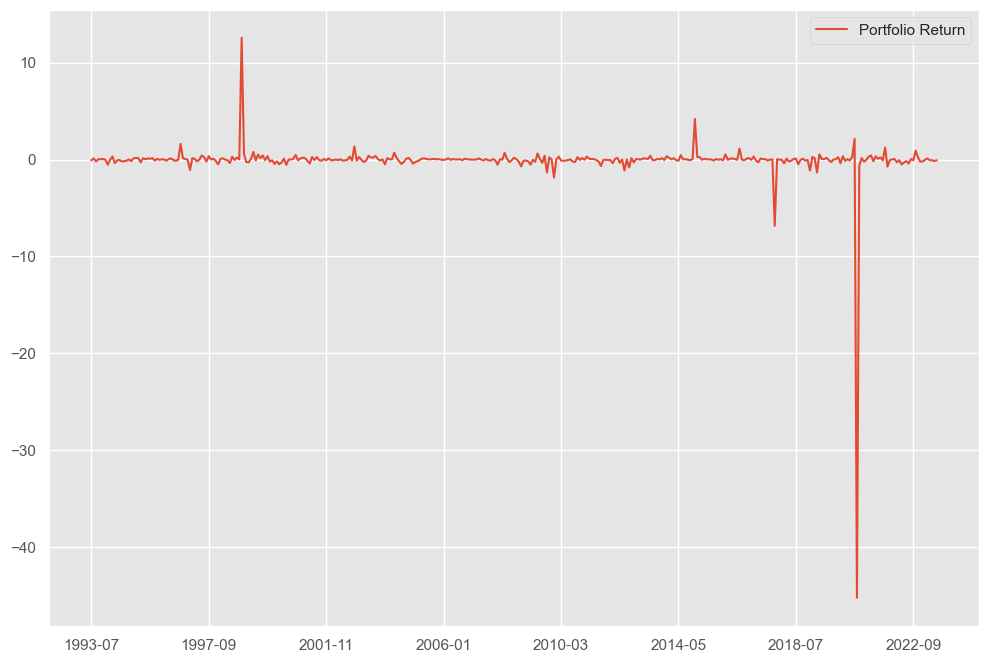

In [320]:
portfolio_return_trailing.plot()

In [321]:
# trailing 6, simple view and simple confidence

weights_trailing, portfolio_return_trailing = trailing_bl_portfolio(start='1993-01', end='2023-07', window=6, 
                                                                    adjustment=[1,3], views=views_simple, confidence=confidence_simple)

In [322]:
(portfolio_return_trailing + 1).cumprod()

,Portfolio Return
1993-07,0.989604
1993-08,0.975321
1993-09,0.935998
1993-10,1.031515
1993-11,1.044365
...,...
2023-03,0.000947
2023-04,0.001079
2023-05,0.000874
2023-06,0.000994


<Axes: >

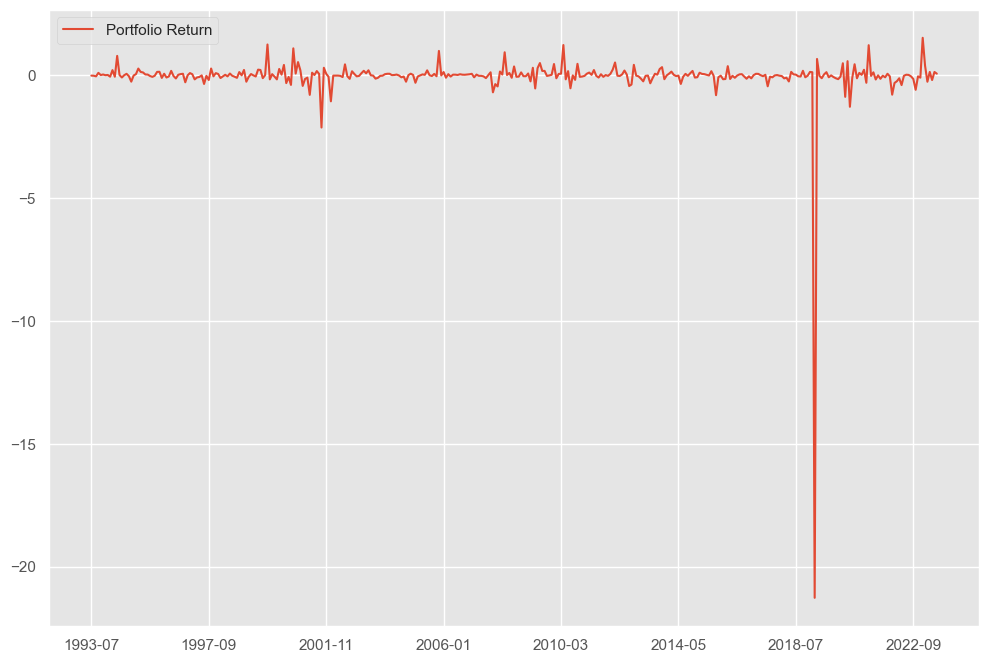

In [323]:
portfolio_return_trailing.plot()

In [324]:
# trailing 24, simple view and simple confidence

weights_trailing, portfolio_return_trailing = trailing_bl_portfolio(start='1991-07', end='2023-07', window=24, 
                                                                    adjustment=[1,3], views=views_simple, confidence=confidence_simple)

In [325]:
(portfolio_return_trailing + 1).cumprod()

,Portfolio Return
1993-07,0.881526
1993-08,0.849358
1993-09,0.842227
1993-10,0.730644
1993-11,0.734721
...,...
2023-03,0.000861
2023-04,0.000828
2023-05,0.000779
2023-06,0.000977


<Axes: >

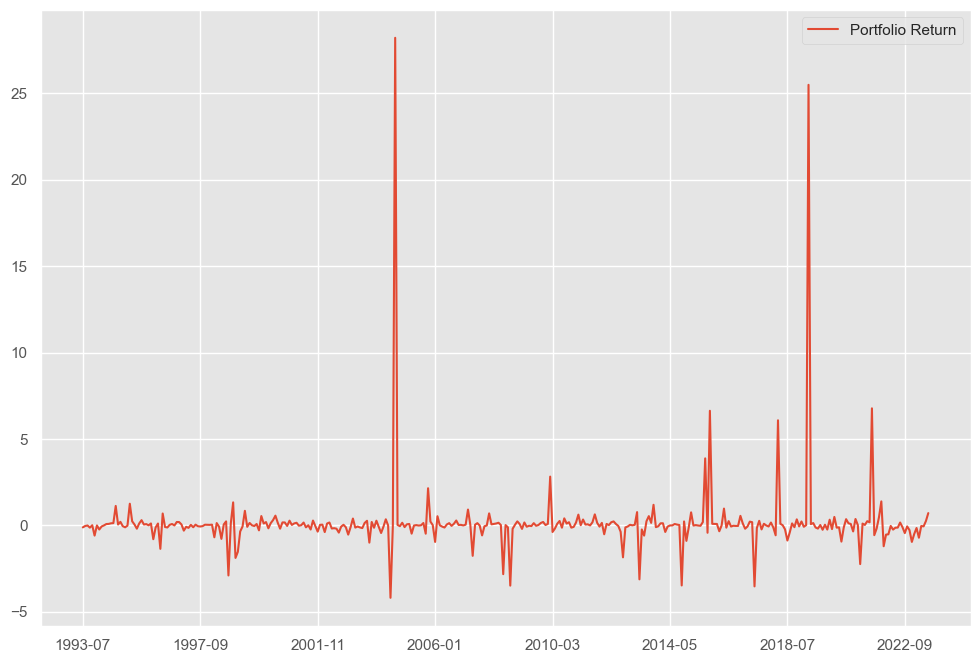

In [326]:
portfolio_return_trailing.plot()

In [327]:
# trailing 12, simple view and simple confidence, broader range of risk aversion

weights_trailing, portfolio_return_trailing = trailing_bl_portfolio(start='1992-07', end='2023-07', window=12, 
                                                                    adjustment=[0.01,10], views=views_simple, confidence=confidence_simple)

In [328]:
(portfolio_return_trailing + 1).cumprod()

,Portfolio Return
1993-07,0.954188
1993-08,1.268976
1993-09,1.254431
1993-10,1.275522
1993-11,1.510282
...,...
2023-03,103.418841
2023-04,104.533815
2023-05,173.070616
2023-06,196.676644


<Axes: >

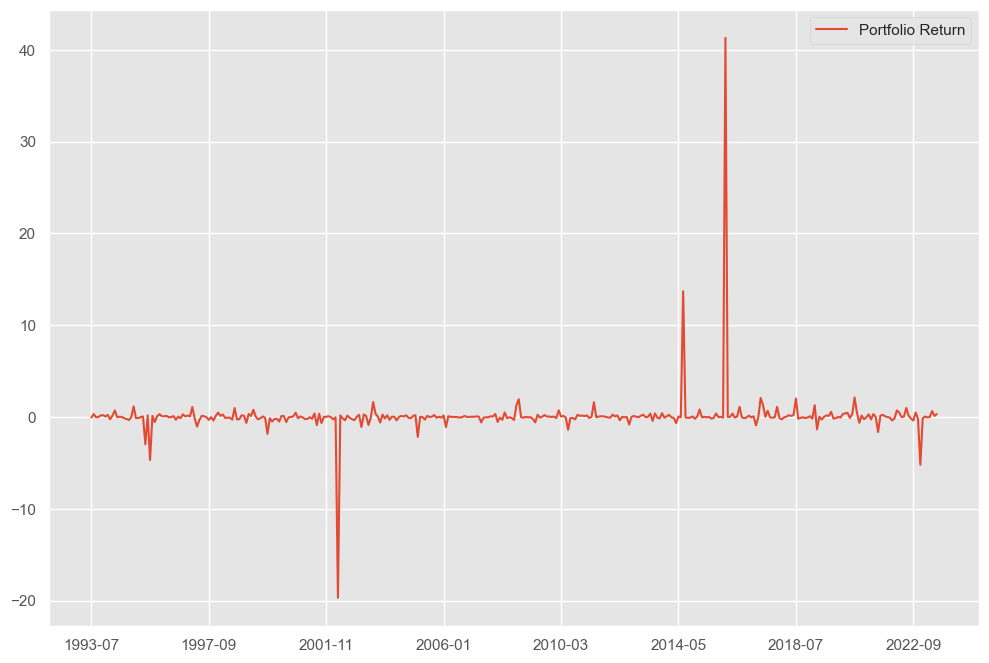

In [329]:
portfolio_return_trailing.plot()

### Hyperparameter Selection

In [24]:
def cumulative_return(ret):
    return (ret + 1).cumprod().iloc[-1].values[0]

In [25]:
def sharpe_ratio(r, riskfree_rate=kit.get_risk_free_rate()['1993-07':'2023-07']['RF'].values, periods_per_year=12):
    """
    Computes the annualized sharpe ratio of a set of returns
    """
    r = r.values.flatten()
    excess_ret = r - riskfree_rate
    ann_ex_ret = kit.annualize_rets(excess_ret, periods_per_year)
    ann_vol = kit.annualize_vol(r, periods_per_year)
    return ann_ex_ret/ann_vol

In [26]:
def drawdown(return_series: pd.Series):
    """Takes a time series of asset returns.
       returns a DataFrame with columns for
       the wealth index, 
       the previous peaks, and 
       the percentage drawdown
    """
    wealth_index = 1000*(1+return_series).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks)/previous_peaks
    return drawdowns.min().values[0]

In [41]:
window_choices = [6, 12, 18, 24, 30, 36]
adjustment_choices = [[1, 3], [0.2, 10]]
view_choices = [views_simple, views_weighted]
omega_method_choices = ['idzorek', 'default']
maximization_objectives= ['mv', 'msr']
weights_constraint_choices= [1, 'between 0 and 1']
determining_metrics = [cumulative_return, sharpe_ratio, drawdown]
combinations = list(itertools.product(window_choices, adjustment_choices, view_choices, omega_method_choices, maximization_objectives, weights_constraint_choices))
number = len(combinations)

In [46]:
start_dates_mapping = {6: '1993-01', 12: '1992-07', 18: '1992-01', 24: '1991-07', 30: '1991-01', 36: '1990-07'}

In [47]:
def best_param_selector_helper(window_choice, adjustment_choice, view_choice, omega_method_choice, 
                               maximization_objective, weights_constraint_choice):
    weights_trailing, portfolio_return_trailing = trailing_bl_portfolio(start=start_dates_mapping[window_choice], 
                                                                        end='2023-07', window=window_choice, adjustment=adjustment_choice, 
                                                                        views=view_choice, confidence=confidence_simple, 
                                                                        omega_method=omega_method_choice, max_obj=maximization_objective,
                                                                        weights_constraint=weights_constraint_choice)
    return [metric(portfolio_return_trailing) for metric in determining_metrics]

In [212]:
best_param_selector_helper(6, [1, 3], views_simple, 'default', 'msr', 1)

[18.43067158155952, 0.40378470555587187, -0.5116938889044792]

In [25]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Check why optimizers work better for mean-variance objective compared to sharpe ratio?

In [213]:
metrics_return_params_dict = {str(i): best_param_selector_helper(combinations[i][0], combinations[i][1], combinations[i][2], combinations[i][3], combinations[i][4], combinations[i][5]) for i in range(0, number)}

In [220]:
print("The maximum cumulative return is ", max(metrics_return_params_dict.values(), key=lambda x: x[0])[0])

The maximum cumulative return is  995.5678427966263


In [222]:
print("The index of maximum cumulative return is ", max(metrics_return_params_dict, key=lambda x: metrics_return_params_dict.get(x)[0]))

The index of maximum cumulative return is  7


In [223]:
print("The highest sharpe ratio is ", max(metrics_return_params_dict.values(), key=lambda x: x[1])[1])

The highest sharpe ratio is  0.6463675040119689


In [224]:
print("The index of highest sharpe ratio is ", max(metrics_return_params_dict, key=lambda x: metrics_return_params_dict.get(x)[1]))

The index of highest sharpe ratio is  179


In [225]:
print("The smallest max drawdown is ", max(metrics_return_params_dict.values(), key=lambda x: x[2])[2])

The smallest max drawdown is  -0.45325118023415767


In [226]:
print("The index of smallest max drawdown is ", max(metrics_return_params_dict, key=lambda x: metrics_return_params_dict.get(x)[2]))

The index of smallest max drawdown is  166


### Visualization on Best Hyperparameter Models

#### Market and Value Weighted 

In [14]:
def winrate(ret):
    return ret[ret['Portfolio Return'].values > 0].shape[0] / ret.shape[0]

In [15]:
market_ret = pd.DataFrame({'Portfolio Return': sp500_monthly['1993-07':]})

In [16]:
market_ret

,Portfolio Return
Date,
1993-07,-0.005327
1993-08,0.034432
1993-09,-0.009988
1993-10,0.019393
1993-11,-0.012911
...,...
2023-03,0.035052
2023-04,0.014642
2023-05,0.002482


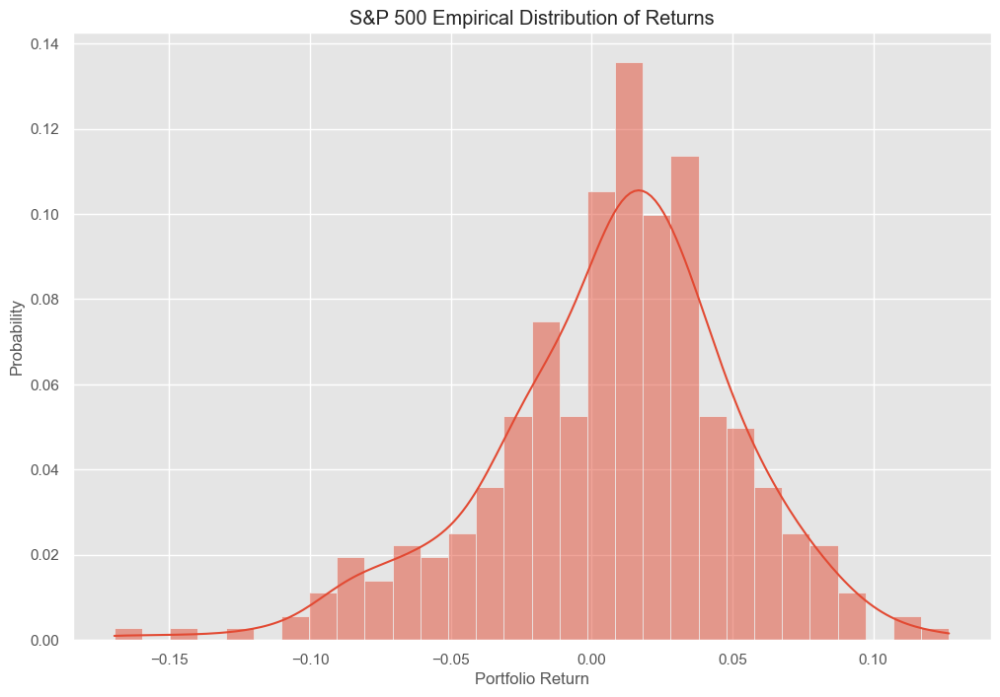

In [17]:
sns.histplot(market_ret, x='Portfolio Return', bins=30, stat='probability', kde=True)
plt.title('S&P 500 Empirical Distribution of Returns');

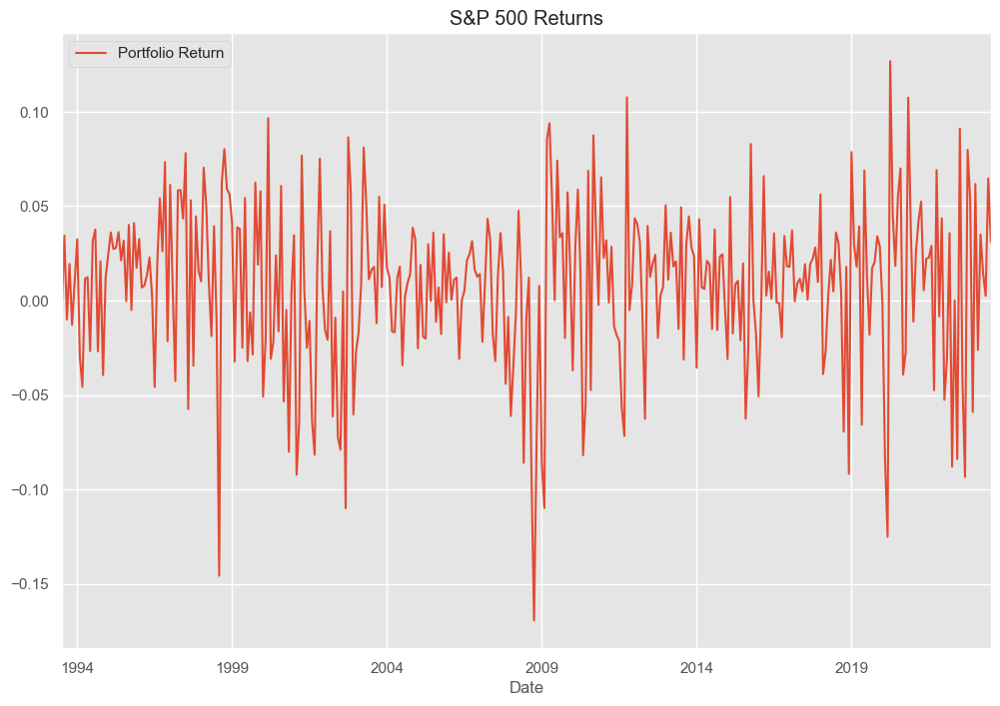

In [18]:
market_ret.plot()
plt.title('S&P 500 Returns');

In [19]:
print(f'S&P 500 winrate is {winrate(market_ret)}.')

S&P 500 winrate is 0.6398891966759003.


In [20]:
print(f'S&P 500 average return is {market_ret.mean()}.')

S&P 500 average return is Portfolio Return    0.007402
dtype: float64.


In [21]:
print(f'S&P 500 return volatility is {market_ret.std()}.')

S&P 500 return volatility is Portfolio Return    0.043415
dtype: float64.


In [27]:
print(f'S&P 500 cumulative return is {cumulative_return(market_ret)}.')

S&P 500 cumulative return is 10.185692347615504.


In [28]:
print(f'S&P 500 annualized sharpe ratio is {sharpe_ratio(market_ret)}.')

S&P 500 annualized sharpe ratio is 0.37599350243204943.


In [29]:
print(f'S&P 500 max drawdown is {drawdown(market_ret)}.')

S&P 500 max drawdown is -0.5255585947031326.


In [30]:
ind_rets = kit.get_ind_returns(weighting="vw", n_inds=30)["1993-07":"2023-07"]
ind_mcap = kit.get_ind_market_caps(30, weights=True)["1993-07":"2023-07"]

In [31]:
vw_market_ret = pd.DataFrame({'Portfolio Return': (ind_rets * ind_mcap).sum(1)})

In [32]:
vw_market_ret

,Portfolio Return
1993-07,-0.000945
1993-08,0.039346
1993-09,0.001314
1993-10,0.016484
1993-11,-0.015727
...,...
2023-03,0.029257
2023-04,0.010081
2023-05,0.006464
2023-06,0.068812


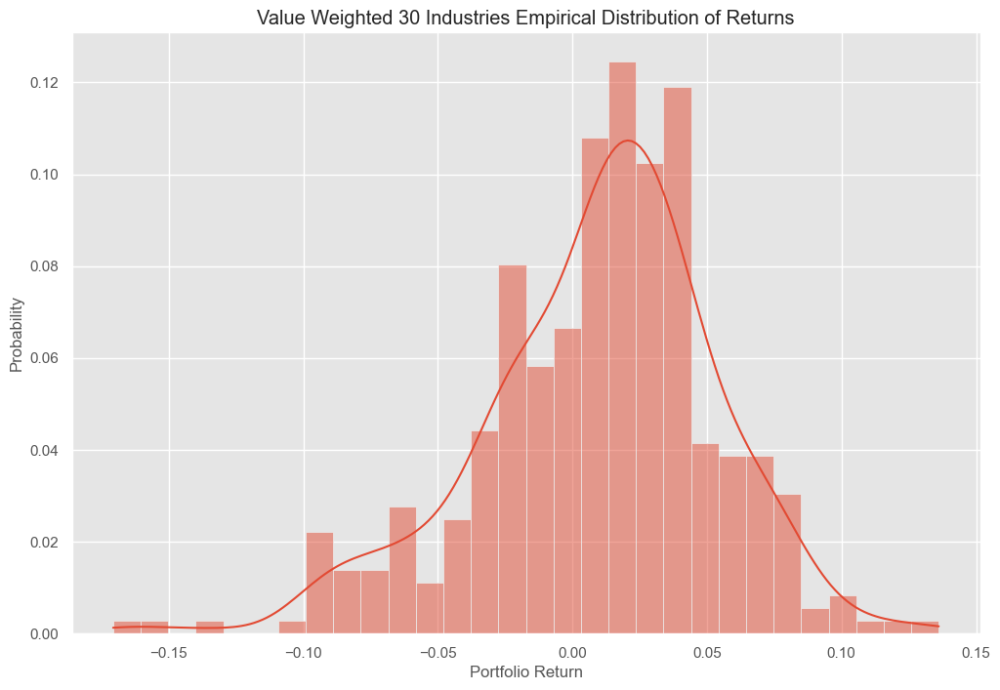

In [33]:
sns.histplot(vw_market_ret, x='Portfolio Return', bins=30, stat='probability', kde=True)
plt.title('Value Weighted 30 Industries Empirical Distribution of Returns');

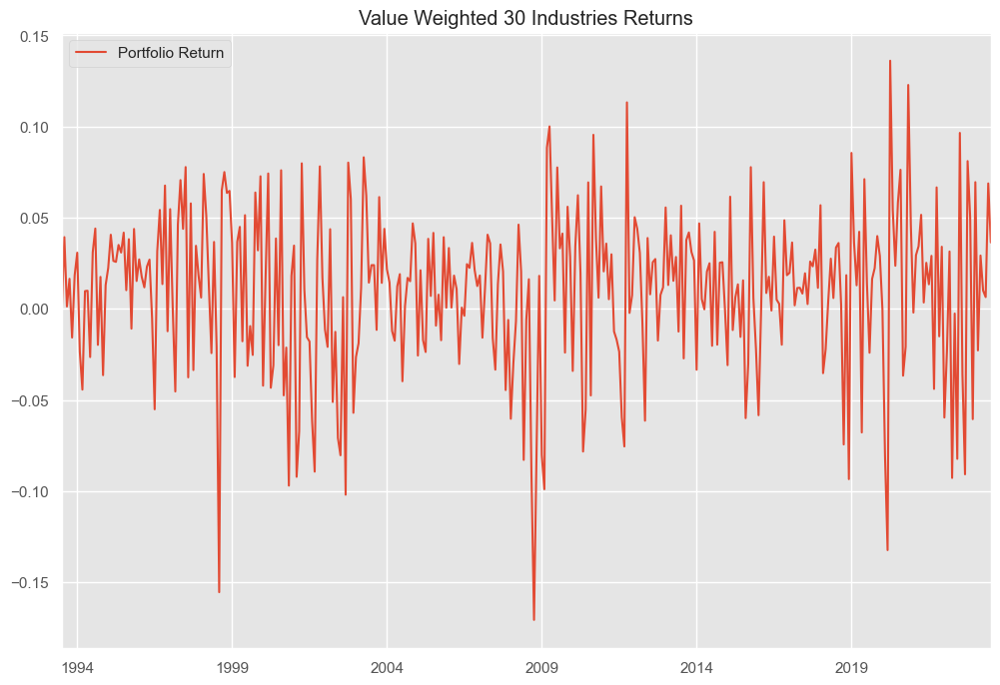

In [34]:
vw_market_ret.plot()
plt.title('Value Weighted 30 Industries Returns');

In [35]:
print(f'Value Weighted 30 Industries winrate is {winrate(vw_market_ret)}.')

Value Weighted 30 Industries winrate is 0.6565096952908587.


In [36]:
print(f'Value Weighted 30 Industries average return is {vw_market_ret.mean()}.')

Value Weighted 30 Industries average return is Portfolio Return    0.009204
dtype: float64.


In [37]:
print(f'Value Weighted 30 Industries return volatility is {vw_market_ret.std()}.')

Value Weighted 30 Industries return volatility is Portfolio Return    0.044411
dtype: float64.


In [38]:
print(f'Value Weighted 30 Industries cumulative return is {cumulative_return(vw_market_ret)}.')

Value Weighted 30 Industries cumulative return is 19.125268624319645.


In [39]:
print(f'Value Weighted 30 Industries annualized sharpe ratio is {sharpe_ratio(vw_market_ret)}.')

Value Weighted 30 Industries annualized sharpe ratio is 0.513291758445219.


In [40]:
print(f'Value Weighted 30 Industries max drawdown is {drawdown(vw_market_ret)}.')

Value Weighted 30 Industries max drawdown is -0.5002802571189979.


#### Portfolio Analysis

In [42]:
combinations[7]

(6,
 [1, 3],
              Food      Beer     Smoke     Games     Books     Hshld     Clths  \
 1993-07  0.014638  0.016502  0.016637  0.013713  0.010288  0.009990  0.013303   
 1993-08  0.006092 -0.009949  0.009247  0.014631 -0.005595  0.006921  0.010848   
 1993-09  0.018102  0.021639  0.013309  0.012048  0.015149  0.011756  0.015725   
 1993-10  0.014599  0.018517  0.016293  0.014407  0.024278  0.010692  0.010667   
 1993-11  0.033829 -0.010025  0.048741  0.018381  0.035024  0.008435  0.012796   
 ...           ...       ...       ...       ...       ...       ...       ...   
 2023-03  0.012558  0.008428 -0.022145 -0.020055  0.009410  0.011965  0.012969   
 2023-04  0.004687  0.009118  0.014818  0.012069  0.002305  0.010008  0.013102   
 2023-05  0.004707  0.011196  0.004127  0.011945 -0.002513  0.009828  0.011364   
 2023-06  0.009908  0.007937  0.053411  0.016609 -0.001666 -0.008361 -0.024122   
 2023-07  0.004412  0.007949  0.017594  0.011627 -0.002194 -0.007418  0.054194   
 
 

In [48]:
# Max cum_return
weights_trailing7, portfolio_return_trailing7 = trailing_bl_portfolio(start=start_dates_mapping[combinations[7][0]], end='2023-07', 
                                                                      window=combinations[7][0], adjustment=combinations[7][1], 
                                                                      views=combinations[7][2], confidence=confidence_simple, 
                                                                      omega_method=combinations[7][3], max_obj=combinations[7][4],
                                                                      weights_constraint=combinations[7][5])

In [49]:
portfolio_return_trailing7

,Portfolio Return
1993-07,-0.021559
1993-08,0.057555
1993-09,0.013068
1993-10,0.087131
1993-11,-0.046474
...,...
2023-03,-0.028173
2023-04,0.069561
2023-05,-0.0582
2023-06,0.096682


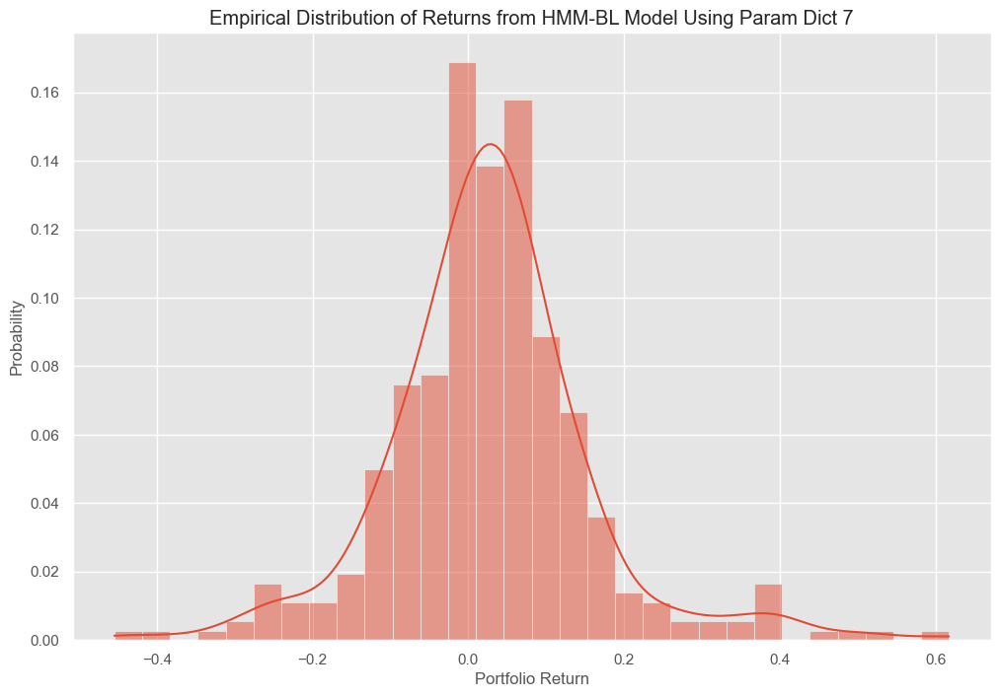

In [50]:
sns.histplot(portfolio_return_trailing7, x='Portfolio Return', bins=30, stat='probability', kde=True)
plt.title('Empirical Distribution of Returns from HMM-BL Model Using Param Dict 7');

In [51]:
(portfolio_return_trailing7 + 1).cumprod()

,Portfolio Return
1993-07,0.978441
1993-08,1.034755
1993-09,1.048278
1993-10,1.139616
1993-11,1.086654
...,...
2023-03,861.325808
2023-04,921.240902
2023-05,867.624681
2023-06,951.508509


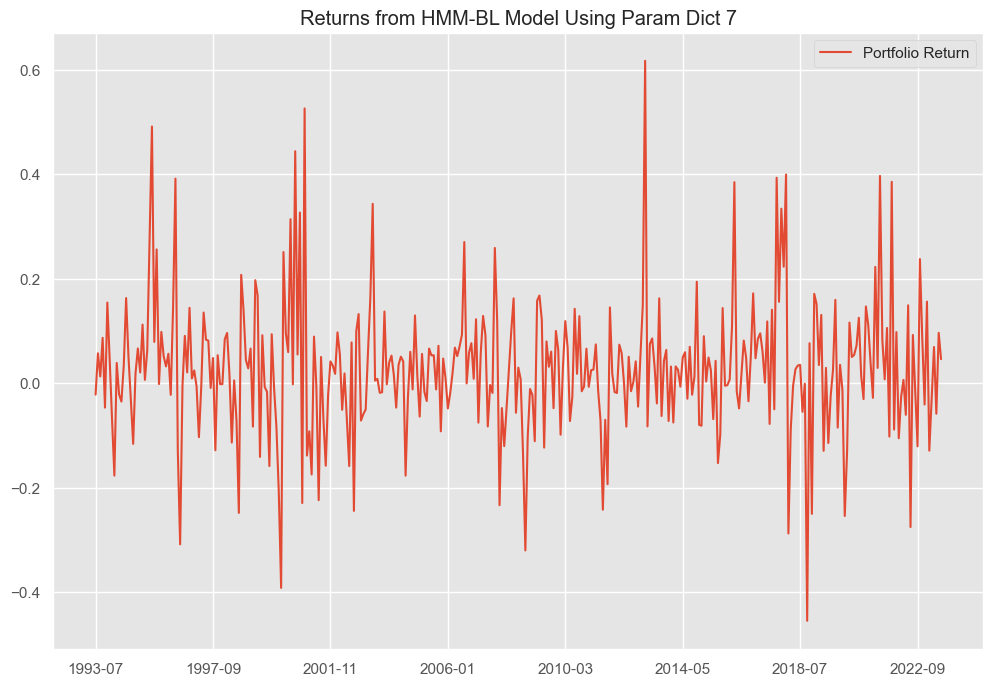

In [52]:
portfolio_return_trailing7.plot()
plt.title('Returns from HMM-BL Model Using Param Dict 7');

TODO: Calculate the value weighted portfolio original winrate and sharpe ratio.

In [53]:
print("The win rate of Param Dict 7 is ", winrate(portfolio_return_trailing7))

The win rate of Param Dict 7 is  0.5983379501385041


In [332]:
print("The mean of Param Dict 7 return is ", portfolio_return_trailing7.mean())

The mean of Param Dict 7 return is  Portfolio Return    0.027534
dtype: object


In [333]:
print("The standard deviation of Param Dict 7 return is ", portfolio_return_trailing7.std())

The standard deviation of Param Dict 7 return is  Portfolio Return    0.130329
dtype: object


In [54]:
combinations[179]

(36,
 [0.2, 10],
              Food      Beer     Smoke     Games     Books     Hshld     Clths  \
 1993-07  0.014638  0.016502  0.016637  0.013713  0.010288  0.009990  0.013303   
 1993-08  0.006092 -0.009949  0.009247  0.014631 -0.005595  0.006921  0.010848   
 1993-09  0.018102  0.021639  0.013309  0.012048  0.015149  0.011756  0.015725   
 1993-10  0.014599  0.018517  0.016293  0.014407  0.024278  0.010692  0.010667   
 1993-11  0.033829 -0.010025  0.048741  0.018381  0.035024  0.008435  0.012796   
 ...           ...       ...       ...       ...       ...       ...       ...   
 2023-03  0.012558  0.008428 -0.022145 -0.020055  0.009410  0.011965  0.012969   
 2023-04  0.004687  0.009118  0.014818  0.012069  0.002305  0.010008  0.013102   
 2023-05  0.004707  0.011196  0.004127  0.011945 -0.002513  0.009828  0.011364   
 2023-06  0.009908  0.007937  0.053411  0.016609 -0.001666 -0.008361 -0.024122   
 2023-07  0.004412  0.007949  0.017594  0.011627 -0.002194 -0.007418  0.054194   

In [55]:
# Max sharpe
weights_trailing179, portfolio_return_trailing179 = trailing_bl_portfolio(start=start_dates_mapping[combinations[179][0]], end='2023-07', 
                                                                      window=combinations[179][0], adjustment=combinations[179][1], 
                                                                      views=combinations[179][2], confidence=confidence_simple, 
                                                                      omega_method=combinations[179][3], max_obj=combinations[179][4],
                                                                      weights_constraint=combinations[179][5])

In [337]:
portfolio_return_trailing179

,Portfolio Return
1993-07,0.046356
1993-08,0.01031
1993-09,-0.041253
1993-10,0.020172
1993-11,-0.018468
...,...
2023-03,0.006137
2023-04,0.002687
2023-05,-0.034433
2023-06,0.095233


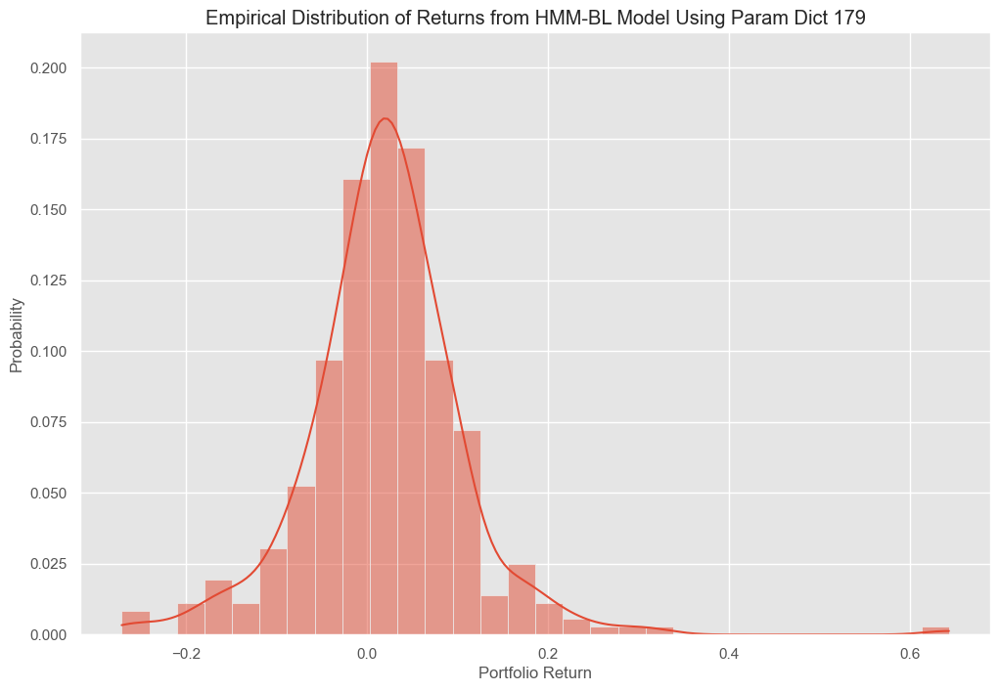

In [338]:
sns.histplot(portfolio_return_trailing179, x='Portfolio Return', bins=30, stat='probability', kde=True)
plt.title('Empirical Distribution of Returns from HMM-BL Model Using Param Dict 179');

In [339]:
(portfolio_return_trailing179 + 1).cumprod()

,Portfolio Return
1993-07,1.046356
1993-08,1.057143
1993-09,1.013533
1993-10,1.033978
1993-11,1.014882
...,...
2023-03,372.034471
2023-04,373.034004
2023-05,360.1892
2023-06,394.491218


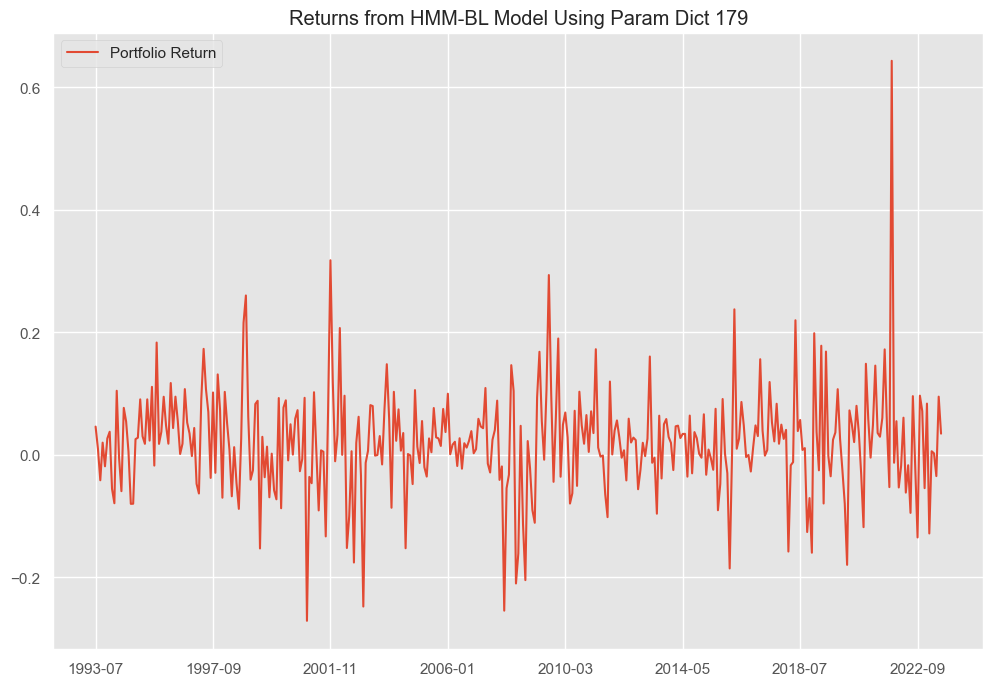

In [340]:
portfolio_return_trailing179.plot()
plt.title('Returns from HMM-BL Model Using Param Dict 179');

In [341]:
print("The win rate of Param Dict 179 is ", winrate(portfolio_return_trailing179))

The win rate of Param Dict 179 is  0.6454293628808865


In [342]:
print("The mean of Param Dict 179 return is ", portfolio_return_trailing179.mean())

The mean of Param Dict 179 return is  Portfolio Return    0.020418
dtype: object


In [343]:
print("The standard deviation of Param Dict 179 return is ", portfolio_return_trailing179.std())

The standard deviation of Param Dict 179 return is  Portfolio Return    0.087007
dtype: object


In [354]:
combinations[166]

(36,
 [1, 3],
              Food      Beer     Smoke     Games     Books     Hshld     Clths  \
 1993-07  0.014638  0.016502  0.016637  0.013713  0.010288  0.009990  0.013303   
 1993-08  0.006092 -0.009949  0.009247  0.014631 -0.005595  0.006921  0.010848   
 1993-09  0.018102  0.021639  0.013309  0.012048  0.015149  0.011756  0.015725   
 1993-10  0.014599  0.018517  0.016293  0.014407  0.024278  0.010692  0.010667   
 1993-11  0.033829 -0.010025  0.048741  0.018381  0.035024  0.008435  0.012796   
 ...           ...       ...       ...       ...       ...       ...       ...   
 2023-03  0.012558  0.008428 -0.022145 -0.020055  0.009410  0.011965  0.012969   
 2023-04  0.004687  0.009118  0.014818  0.012069  0.002305  0.010008  0.013102   
 2023-05  0.004707  0.011196  0.004127  0.011945 -0.002513  0.009828  0.011364   
 2023-06  0.009908  0.007937  0.053411  0.016609 -0.001666 -0.008361 -0.024122   
 2023-07  0.004412  0.007949  0.017594  0.011627 -0.002194 -0.007418  0.054194   
 


In [56]:
# Min Max Drawdown
weights_trailing166, portfolio_return_trailing166 = trailing_bl_portfolio(start=start_dates_mapping[combinations[166][0]], end='2023-07', 
                                                                      window=combinations[166][0], adjustment=combinations[166][1], 
                                                                      views=combinations[166][2], confidence=confidence_simple, 
                                                                      omega_method=combinations[166][3], max_obj=combinations[166][4],
                                                                      weights_constraint=combinations[166][5])

In [356]:
portfolio_return_trailing166

,Portfolio Return
1993-07,0.011945
1993-08,0.02559
1993-09,-0.011889
1993-10,0.004926
1993-11,-0.019081
...,...
2023-03,0.037929
2023-04,0.02429
2023-05,-0.034339
2023-06,0.0392


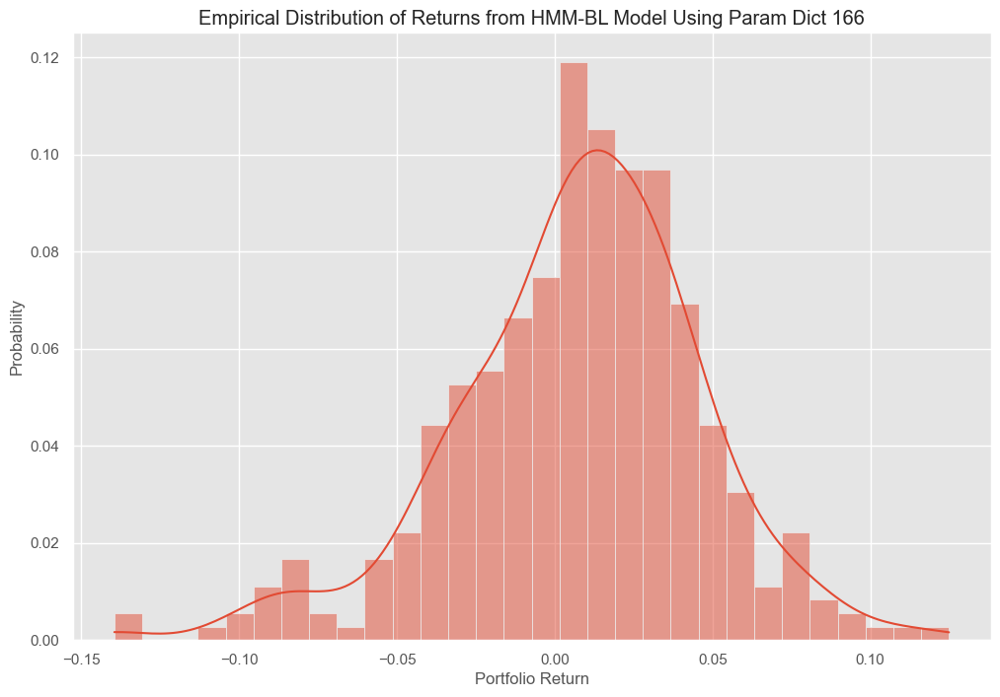

In [357]:
sns.histplot(portfolio_return_trailing166, x='Portfolio Return', bins=30, stat='probability', kde=True)
plt.title('Empirical Distribution of Returns from HMM-BL Model Using Param Dict 166');

In [358]:
(portfolio_return_trailing166 + 1).cumprod()

,Portfolio Return
1993-07,1.011945
1993-08,1.037841
1993-09,1.025501
1993-10,1.030553
1993-11,1.010889
...,...
2023-03,10.35035
2023-04,10.601757
2023-05,10.237701
2023-06,10.639017


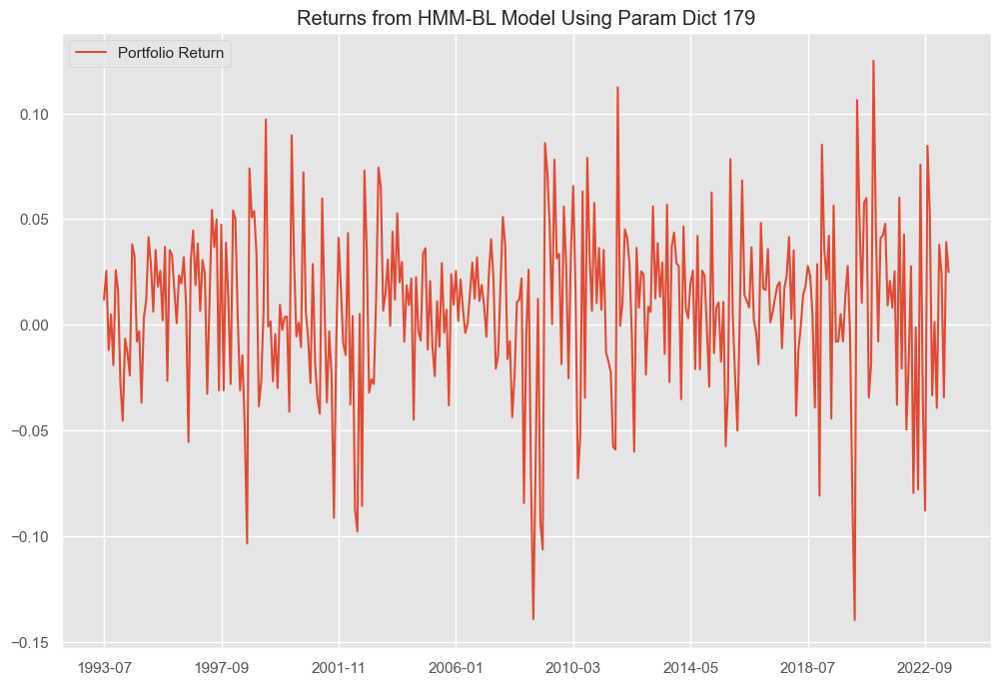

In [359]:
portfolio_return_trailing166.plot()
plt.title('Returns from HMM-BL Model Using Param Dict 179');

In [360]:
print("The win rate of Param Dict 166 is ", winrate(portfolio_return_trailing166))

The win rate of Param Dict 166 is  0.6343490304709142


In [361]:
print("The mean of Param Dict 166 return is ", portfolio_return_trailing166.mean())

The mean of Param Dict 166 return is  Portfolio Return    0.007415
dtype: object


In [362]:
print("The standard deviation of Param Dict 166 return is ", portfolio_return_trailing166.std())

The standard deviation of Param Dict 166 return is  Portfolio Return    0.03924
dtype: object


## Summary Statistics

In [29]:
port_returns = [trailing_bl_portfolio(start=start_dates_mapping[combinations[i][0]], end='2023-07', window=combinations[i][0], adjustment=combinations[i][1], 
                                      views=combinations[i][2], confidence=confidence_simple, omega_method=combinations[i][3], max_obj=combinations[i][4],
                                      weights_constraint=combinations[i][5])[1] for i in range(number)]

In [36]:
port_returns[3]['Portfolio Return']

1993-07    -0.02174
1993-08    0.049048
1993-09   -0.038946
1993-10    0.087432
1993-11   -0.047295
             ...   
2023-03    0.006137
2023-04    0.002687
2023-05   -0.034433
2023-06    0.881676
2023-07    0.091311
Name: Portfolio Return, Length: 361, dtype: object

In [39]:
port_returns_df = pd.DataFrame({f'Hyperparam Combo {i}':port_returns[i]['Portfolio Return'] for i in range(number)})

In [41]:
# port_returns_df.to_csv('../Data/all_hyper_combo_portfolio_returns.csv', index=True)

In [5]:
## TODO: Rerun port returns tonight and save it to csv!!!!!!

Recognized recessions during the period in interest are 2001-2002 (dot-com bubble), 2007-2009 (subprime mortgage crisis), and 2020-2021 (economic effects of the pandemic).

In [2]:
start_date1 = pd.to_datetime('2001-01')
end_date1 = pd.to_datetime('2002-12')
start_date2 = pd.to_datetime('2007-01')
end_date2 = pd.to_datetime('2009-12')
start_date3 = pd.to_datetime('2020-01')
end_date3 = pd.to_datetime('2021-12')

In [3]:
periods = [(pd.to_datetime('2001-01'), pd.to_datetime('2002-12')),
           (pd.to_datetime('2007-01'), pd.to_datetime('2009-12')),
           (pd.to_datetime('2020-01'), pd.to_datetime('2021-12'))]

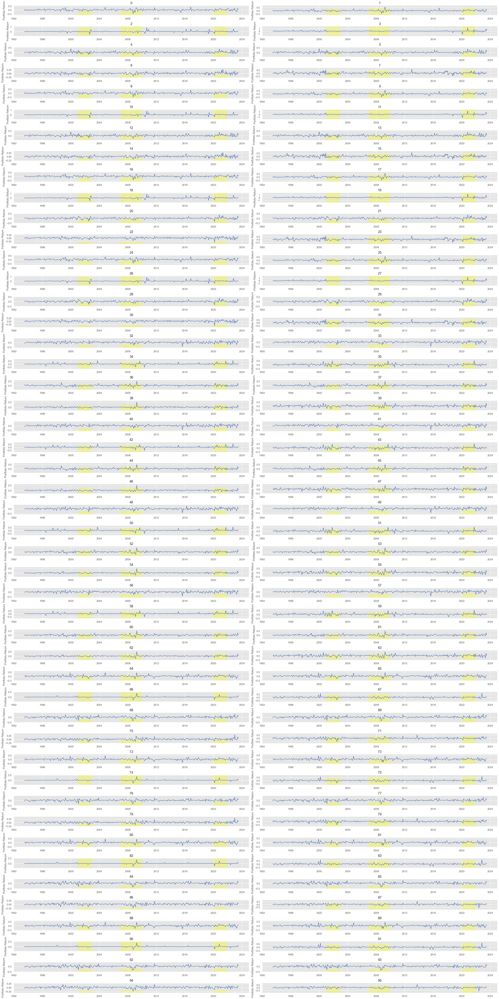

In [46]:
fig, axes = plt.subplots(48, 2, figsize=(30, 60))  
axes = axes.flatten()


for i in range(0, 96):
    ret = port_returns[i]
    ret.index = pd.to_datetime(ret.index)

    sns.lineplot(ret, x=ret.index, y='Portfolio Return', ax=axes[i], color='b')
    for start_date, end_date in periods:
        axes[i].fill_between(ret.index, axes[i].get_ylim()[0], axes[i].get_ylim()[1], 
                            where=(ret.index >= start_date) & (ret.index <= end_date), 
                            color='yellow', alpha=0.3, transform=axes[i].get_xaxis_transform())
    axes[i].set_title(i)


plt.tight_layout()
plt.show()

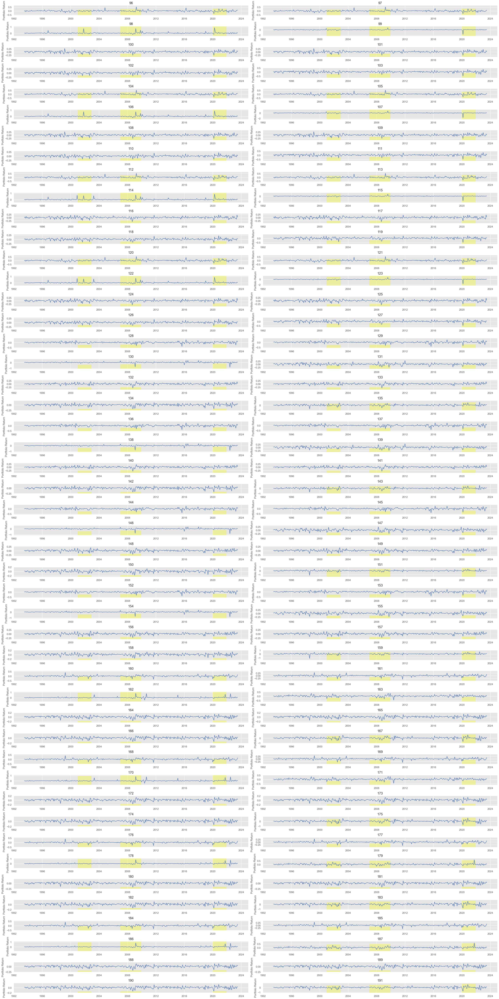

In [48]:
fig, axes = plt.subplots(48, 2, figsize=(30, 60))  
axes = axes.flatten()


for i in range(96, 192):
    ret = port_returns[i]
    ret.index = pd.to_datetime(ret.index)

    sns.lineplot(ret, x=ret.index, y='Portfolio Return', ax=axes[i-96], color='b')
    for start_date, end_date in periods:
        axes[i-96].fill_between(ret.index, axes[i-96].get_ylim()[0], axes[i-96].get_ylim()[1], 
                            where=(ret.index >= start_date) & (ret.index <= end_date), 
                            color='yellow', alpha=0.3, transform=axes[i-96].get_xaxis_transform())
    axes[i-96].set_title(i)


plt.tight_layout()
plt.show()

We observe most of the returns spikes around the turbulent periods of economonic cycle. This indicate the HMM-BL model is able to capture market hidden trend or switch in regime with some false positives. The result inspires me to discover Thompson sampling for online portfolio selection that completes the entire portfolio  selection and management process.

In [57]:
ind_rets = kit.get_ind_returns(weighting="vw", n_inds=30)["1991-07":"2023-07"]
ind_mcap = kit.get_ind_market_caps(30, weights=True)["1991-07":"2023-07"]

,Annualized Return,Annualized Vol,Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown
EW,0.106601,0.162358,-0.579022,5.222279,0.072708,0.107494,0.459009,-0.530866
CW,0.104615,0.155571,-0.615573,4.323060,0.070754,0.101158,0.466625,-0.518908
GMV-Sample,0.067746,0.127957,-0.630900,4.196721,0.059956,0.082980,0.286949,-0.421907
HMM_BL_best_cret,0.257937,0.451474,0.529271,6.101321,0.158131,0.257211,0.490831,-0.737675
HMM_BL_best_Sharpe,0.221209,0.301400,0.876125,10.894087,0.085764,0.173686,0.617153,-0.676863
HMM_BL_best_drawdown,0.082657,0.135931,-0.514125,4.158249,0.061656,0.089745,0.376869,-0.453251


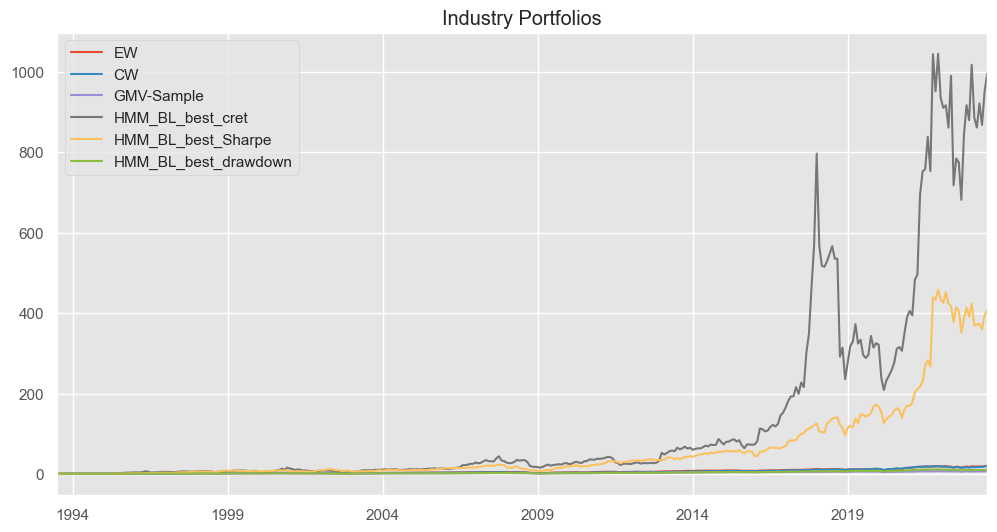

In [58]:
eww, ewr = kit.backtest_ws(ind_rets, estimation_window=24, weighting=kit.weight_ew)
ewr  = ewr.dropna()
cww, cwr = kit.backtest_ws(ind_rets, estimation_window=24, weighting=kit.weight_cw, cap_weights=ind_mcap)
cwr = cwr.dropna()
mv_s_w, mv_s_r = kit.backtest_ws(ind_rets, estimation_window=24, weighting=kit.weight_gmv, cov_estimator=kit.sample_cov)
mv_s_r = mv_s_r.dropna()
btr = pd.DataFrame({"EW": ewr, "CW": cwr, "GMV-Sample": mv_s_r, 
                    'HMM_BL_best_cret': portfolio_return_trailing7['Portfolio Return'].values,
                    'HMM_BL_best_Sharpe': portfolio_return_trailing179['Portfolio Return'].values, 
                    'HMM_BL_best_drawdown': portfolio_return_trailing166['Portfolio Return'].values, 
                   })
(1+btr).cumprod().plot(figsize=(12,6), title="Industry Portfolios")
kit.summary_stats(btr.dropna())

We observe the HMM_BL model has the highest return, but also higher volatility and risk measurements in general. Let's try to set some constraints on the weights.

## Adjusting the Composition of a Portfolio in Graphing

In [59]:
ind_rets_adj_rolling = ind_rets['1994-06':]

In [60]:
def adjusted_return_rolling(weights, port_rets):
    weights = weights[str(ind_rets_adj_rolling.index[0]): ]
    adj_factor = 0.15 / (port_rets.rolling(12).std() * np.sqrt(12)).dropna()
    adj_weights = weights.multiply(adj_factor, axis=0)
    adj_weights.index = ind_rets_adj_rolling.index
    return (ind_rets_adj_rolling * adj_weights).sum(axis=1)

In [61]:
adj_rolling_ewr = adjusted_return_rolling(eww, ewr)
adj_rolling_cwr = adjusted_return_rolling(cww, cwr)
adj_rolling_mv = adjusted_return_rolling(mv_s_w, mv_s_r)
adj_rolling_hmm_bl7 = adjusted_return_rolling(weights_trailing7, portfolio_return_trailing7.iloc[:, 0])
adj_rolling_hmm_bl179 = adjusted_return_rolling(weights_trailing179, portfolio_return_trailing179.iloc[:, 0])
adj_rolling_hmm_bl166 = adjusted_return_rolling(weights_trailing166, portfolio_return_trailing166.iloc[:, 0])

In [62]:
def adjusted_return_total(port_rets):
    return port_rets * .15 / (port_rets.std() * np.sqrt(12))

In [63]:
adj_total_ewr = adjusted_return_total(ewr)
adj_total_cwr = adjusted_return_total(cwr)
adj_total_mv = adjusted_return_total(mv_s_r)
adj_total_hmm_bl7 = adjusted_return_total(portfolio_return_trailing7.iloc[:, 0])
adj_total_hmm_bl179 = adjusted_return_total(portfolio_return_trailing179.iloc[:, 0])
adj_total_hmm_bl166 = adjusted_return_total(portfolio_return_trailing166.iloc[:, 0])

In [69]:
adj_return_rolling = {"Equally Weighted": adj_rolling_ewr, "Value Weighted": adj_rolling_cwr, "Global Minimum Variance (Sample Covariance)": adj_rolling_mv, 
                    'HMM-based B-L Best Cumulative Return': adj_rolling_hmm_bl7,
                    'HMM-based B-L Best Sharpe Ratio': adj_rolling_hmm_bl179, 
                    'HMM-based B-L Best Max Drawdown': adj_rolling_hmm_bl166, 
                     }

In [65]:
adj_return_total = {"EW": adj_total_ewr.values, "CW": adj_total_cwr.values, "GMV-Sample": adj_total_mv.values, 
                    'HMM_BL_best_cret': adj_total_hmm_bl7.values,
                    'HMM_BL_best_Sharpe': adj_total_hmm_bl179.values, 
                    'HMM_BL_best_drawdown': adj_total_hmm_bl166.values, 
                     }

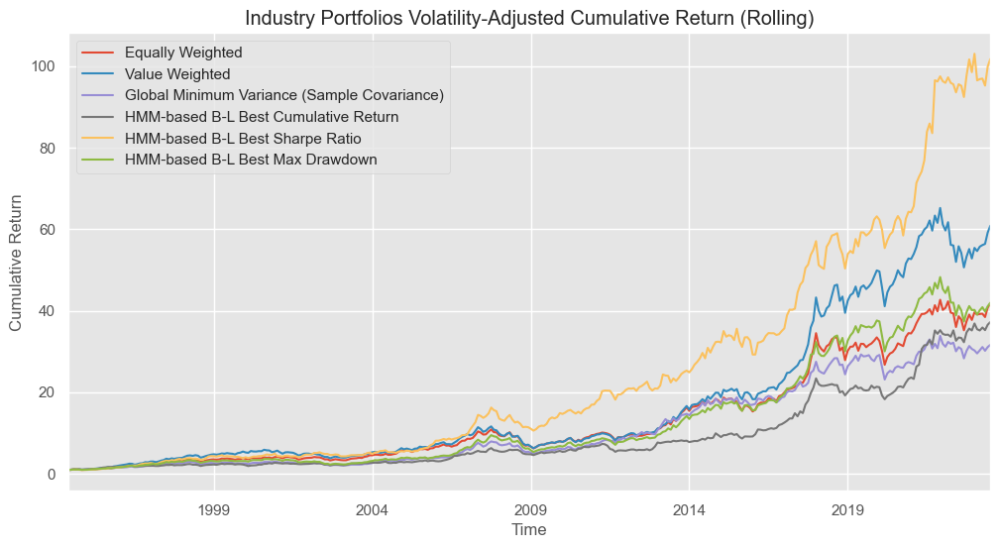

In [104]:
btr_adj_rolling = pd.DataFrame(adj_return_rolling)
(1+btr_adj_rolling).cumprod().plot(figsize=(12,6), title="Industry Portfolios Volatility-Adjusted Cumulative Return (Rolling)")
plt.xlabel('Time')
plt.ylabel('Cumulative Return');

In [74]:
results = kit.summary_stats(btr_adj_rolling.dropna())
results

,Annualized Return,Annualized Vol,Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown
Equally Weighted,0.136465,0.158579,-0.320047,2.921247,0.067571,0.089575,0.653282,-0.427056
Value Weighted,0.151269,0.160531,-0.341329,2.863181,0.067754,0.087076,0.735102,-0.461183
Global Minimum Variance (Sample Covariance),0.125731,0.156059,-0.338246,2.718873,0.067548,0.087147,0.596879,-0.388456
HMM-based B-L Best Cumulative Return,0.132034,0.154660,0.178033,3.813002,0.058949,0.085635,0.641963,-0.270683
HMM-based B-L Best Sharpe Ratio,0.171747,0.153232,0.046325,3.393049,0.057462,0.078771,0.900246,-0.347861
HMM-based B-L Best Max Drawdown,0.136699,0.159227,-0.345155,2.839275,0.068258,0.089943,0.652052,-0.436860


In [85]:
def winrate(ret):
    return np.sum(ret >sp500_monthly['1994-06':'2023-07']) / len(ret)

In [87]:
results['Winrate'] = btr_adj_rolling.apply(winrate)

In [91]:
results['Cumulative Return'] = btr_adj_rolling.apply(lambda ret: (ret+1).cumprod()[-1])

In [93]:
results[['Winrate', 'Cumulative Return', 'Annualized Return', 'Annualized Vol', 'Sharpe Ratio']]

,Winrate,Cumulative Return,Annualized Return,Annualized Vol,Sharpe Ratio
Equally Weighted,0.542857,41.724294,0.136465,0.158579,0.653282
Value Weighted,0.588571,60.858644,0.151269,0.160531,0.735102
Global Minimum Variance (Sample Covariance),0.548571,31.635331,0.125731,0.156059,0.596879
HMM-based B-L Best Cumulative Return,0.480000,37.230645,0.132034,0.154660,0.641963
HMM-based B-L Best Sharpe Ratio,0.551429,101.778715,0.171747,0.153232,0.900246
HMM-based B-L Best Max Drawdown,0.585714,41.975558,0.136699,0.159227,0.652052


In [98]:
results[['Skewness', 'Kurtosis', 'Cornish-Fisher VaR (5%)', 'Historic CVaR (5%)', 'Max Drawdown']]

,Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Max Drawdown
Equally Weighted,-0.320047,2.921247,0.067571,0.089575,-0.427056
Value Weighted,-0.341329,2.863181,0.067754,0.087076,-0.461183
Global Minimum Variance (Sample Covariance),-0.338246,2.718873,0.067548,0.087147,-0.388456
HMM-based B-L Best Cumulative Return,0.178033,3.813002,0.058949,0.085635,-0.270683
HMM-based B-L Best Sharpe Ratio,0.046325,3.393049,0.057462,0.078771,-0.347861
HMM-based B-L Best Max Drawdown,-0.345155,2.839275,0.068258,0.089943,-0.436860


In [97]:
results

,Annualized Return,Annualized Vol,Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown,Winrate,Cumulative Return
Equally Weighted,0.136465,0.158579,-0.320047,2.921247,0.067571,0.089575,0.653282,-0.427056,0.542857,41.724294
Value Weighted,0.151269,0.160531,-0.341329,2.863181,0.067754,0.087076,0.735102,-0.461183,0.588571,60.858644
Global Minimum Variance (Sample Covariance),0.125731,0.156059,-0.338246,2.718873,0.067548,0.087147,0.596879,-0.388456,0.548571,31.635331
HMM-based B-L Best Cumulative Return,0.132034,0.154660,0.178033,3.813002,0.058949,0.085635,0.641963,-0.270683,0.480000,37.230645
HMM-based B-L Best Sharpe Ratio,0.171747,0.153232,0.046325,3.393049,0.057462,0.078771,0.900246,-0.347861,0.551429,101.778715
HMM-based B-L Best Max Drawdown,0.136699,0.159227,-0.345155,2.839275,0.068258,0.089943,0.652052,-0.436860,0.585714,41.975558


<Axes: title={'center': 'Industry Portfolios Adjusted Return (Total)'}>

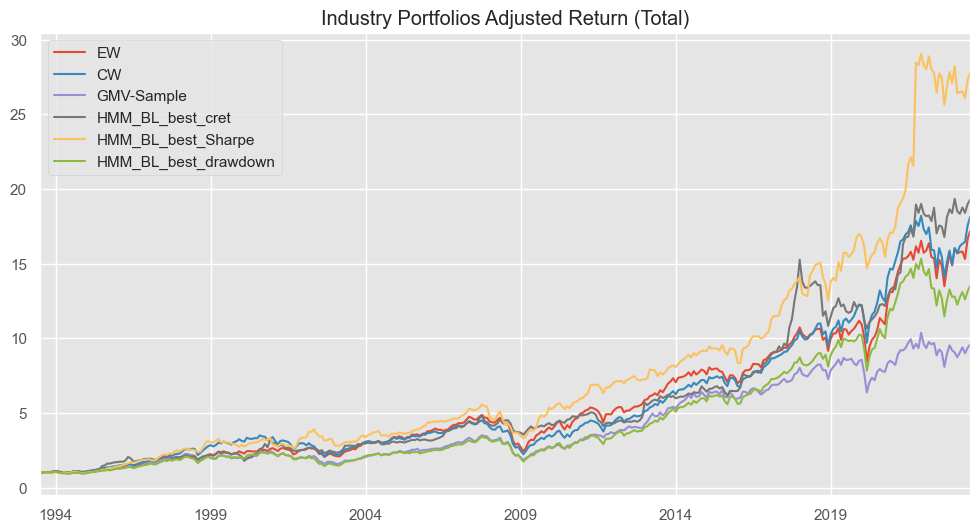

In [68]:
btr_adj_total = pd.DataFrame(adj_return_total, index= ind_rets['1993-07':].index)

(1+btr_adj_total).cumprod().plot(figsize=(12,6), title="Industry Portfolios Adjusted Return (Total)")

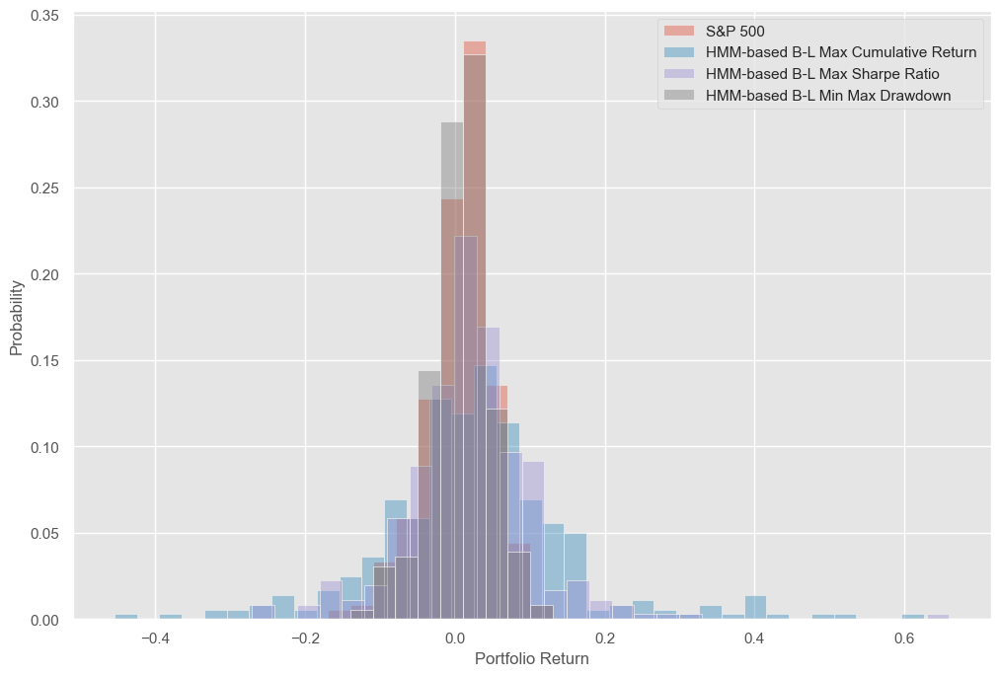

In [109]:
sns.histplot(market_ret, x='Portfolio Return', binwidth=0.03, stat='probability', label='S&P 500', alpha=0.4)
# sns.histplot(vw_market_ret, x='Portfolio Return', binwidth=0.03, stat='probability', label='Value Weighed', alpha=0.4)
sns.histplot(portfolio_return_trailing7, x='Portfolio Return', binwidth=0.03, stat='probability', label='HMM-based B-L Max Cumulative Return', alpha=0.4)
sns.histplot(portfolio_return_trailing179, x='Portfolio Return', binwidth=0.03, stat='probability', label='HMM-based B-L Max Sharpe Ratio', alpha=0.4)
sns.histplot(portfolio_return_trailing166, x='Portfolio Return', binwidth=0.03, stat='probability', label='HMM-based B-L Min Max Drawdown', alpha=0.4)
plt.legend()

In [122]:
comparetomarketdensity = btr_adj_rolling.iloc[:, -3:]
comparetomarketdensity['S&P 500'] = market_ret
comparetomarketdensity.head()

,HMM-based B-L Best Cumulative Return,HMM-based B-L Best Sharpe Ratio,HMM-based B-L Best Max Drawdown,S&P 500
1994-06,-0.017904,-0.048451,-0.046064,-0.026791
1994-07,0.017883,0.059571,0.064954,0.031490
1994-08,0.074209,0.040861,0.053931,0.037599
1994-09,0.023025,0.004425,-0.012993,-0.026878
1994-10,-0.013947,-0.056176,-0.005092,0.020834


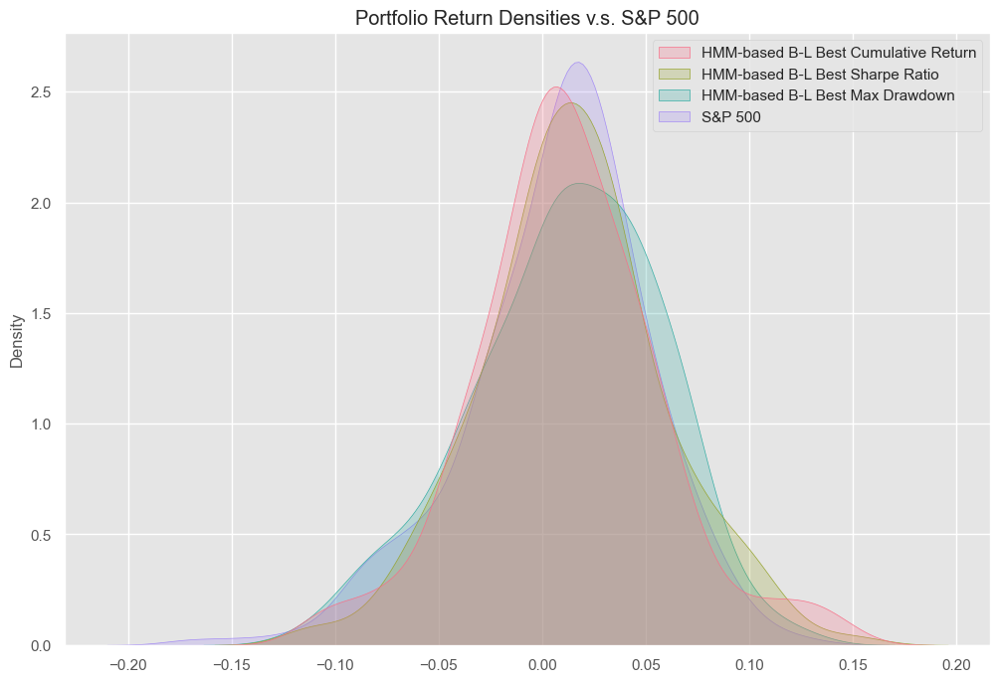

In [129]:
sns.kdeplot(comparetomarketdensity, fill=True, palette="husl")
plt.title('Portfolio Return Densities v.s. S&P 500');


# Further Implications and Extensions

The Black-Litterman model is a widely used approach in portfolio optimization. It combines the ideas from the Capital Asset Pricing Model (CAPM) and the Mean-Variance Optimization model and integrates the investor's views into the portfolio construction process. Since its introduction, several extensions and modifications have been proposed to address various limitations and adapt it to different investment contexts. Some notable extensions include:

1. **Bayesian Approach**: This extension incorporates Bayesian methods to update the expected returns based on the investor's views, allowing for a more dynamic and probabilistic approach to incorporating subjective views.

2. **Global Views**: This involves extending the model to handle global asset allocation problems, where assets are spread across multiple countries and asset classes.

3. **Incorporating Transaction Costs**: Some extensions focus on integrating transaction costs into the model, making it more applicable to real-world scenarios where buying and selling assets incurs costs.

4. **Robust Optimization**: Modifications that include robust optimization techniques aim to make the model more resistant to errors in the input data, such as estimated returns, covariances, and market capitalizations.

5. **Factor Models**: Integrating factor-based approaches (like Fama-French factors) with the Black-Litterman model to better capture the sources of risk and return in the portfolio.

6. **Machine Learning Techniques**: Recent developments have seen the incorporation of machine learning algorithms to estimate the input parameters more accurately, especially in the context of big data and complex market dynamics.

7. **Risk Parity and Alternative Risk Measures**: Some extensions focus on incorporating alternative risk measures like Conditional Value at Risk (CVaR) or applying risk parity concepts within the Black-Litterman framework.

8. **ESG Integration**: Adapting the model to include Environmental, Social, and Governance (ESG) factors, which is increasingly relevant for socially responsible investing.

9. **High-Dimensional Data Handling**: Enhancements for better handling high-dimensional data sets, addressing issues like overfitting and estimation error magnification in traditional models.

10. **Liquidity Adjustment**: Adjusting the model to account for the liquidity of different assets, which is crucial for large portfolios where significant transactions can impact market prices.

These extensions and modifications are part of ongoing efforts to make the Black-Litterman model more adaptable to the changing financial landscape and the diverse needs of investors. They reflect the continuous evolution of portfolio optimization theory as it integrates more sophisticated risk management techniques, new types of data, and advanced computational methods.

In [550]:
# port_returns[25].to_csv('../Data/HMM-BL25.csv')

In [551]:
# port_returns[45].to_csv('../Data/HMM-BL45.csv')